# Var wild fire 2021 analyze study with Planetary computer
by Titouan Kerneur, Edouard Lacourt

During our class of Geographical Data, we had to do a project where we should find a new dataset and explore it.
The idea of finding a new data set was easy for us. During the summer 2021 and my vacations, i lived the wild fire near my vacations area so it come to our mind to analyse this area and the destruction it cause to the wild area in the countryside of St Tropez. 
To find this dataset, we just had to look on the net the cities that where conserne by this fire that happened during the 16th of August to the 25th of August.
The city that have been hit by the fire where: Gonfaron, La Garde-Freinet, Le Luc, Vidauban, les Mayons, Le Cannet-des-Maures, la Môle, Grimaud and Cogolin.
The squared area that have been burn is 6500 Hectars.

In [307]:
# Planetary Computer, STAC
import pystac
from pystac.extensions.eo import EOExtension as eo
import pystac_client
import planetary_computer

# Stats and vector data
import numpy as np
import pandas as pd
import geopandas as gpd
import shapely

# Image processing
import rasterio as rio
import rasterio.plot, rasterio.features, rasterio.mask, rasterio.fill  # Not loaded by default
import skimage.morphology, skimage.measure

# Plotting
import matplotlib.pyplot as plt
import IPython.display
import ipywidgets
import leafmap

# For nice HTML outputs
import rich.table

## Boundaries area of interest 
In this part the goal is to determine the area of interest. To do so, we will use wfs to get cities polygons.

In [308]:
# Load json features from WFS
wfs_communes = "https://wxs.ign.fr/topographie/geoportail/wfs?SERVICE=WFS&VERSION=2.0.0" \
               "&request=GetFeature&OUTPUTFORMAT=application/json&typename=BDTOPO_V3:commune&CQL_FILTER=code_insee_du_departement=83"
# If you ever want to cache the result of the HTTP request, you could use the request lib to fetch the result and store it

In [309]:
# But here GeoPandas will handle the request for us.
# It can read various types of URLs, locally or remote, files or archives, database queries, ...
communes = gpd.read_file(wfs_communes)
communes.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 153 entries, 0 to 152
Data columns (total 26 columns):
 #   Column                              Non-Null Count  Dtype              
---  ------                              --------------  -----              
 0   id                                  153 non-null    object             
 1   code_insee                          153 non-null    object             
 2   code_insee_de_l_arrondissement      153 non-null    object             
 3   code_insee_de_la_collectivite_terr  153 non-null    object             
 4   code_insee_du_departement           153 non-null    object             
 5   code_insee_de_la_region             153 non-null    object             
 6   population                          153 non-null    int64              
 7   surface_en_ha                       153 non-null    int64              
 8   date_creation                       153 non-null    datetime64[ns, UTC]
 9   date_modification                  

In [310]:
# Drop datetime columns because it's incompatible with folium
communes.drop(['date_creation', 'date_modification'], axis=1, inplace=True)


In [311]:
# Explore GeoPandas dataset in interactive folium (leaflet) map
communes.explore(tiles=folium_tile)

We need to select the commune that are part of the wild fire area as AOI for our first analysis, we have here 9 communes as said above, we defind the area of insterest with their insee codes.

In [312]:
area_of_interest = communes.loc[
    communes.code_insee.isin(['83031', '83063', '83148', '83068', '83042', '83079', '83073', '83067', '83075'])
]

<AxesSubplot:>

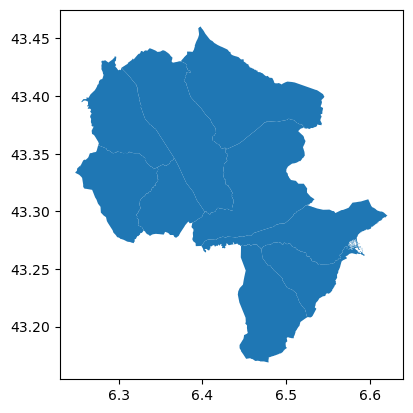

In [313]:
# Basic plot with lat/long axis labels of the study area
area_of_interest.plot()

The following code tends to define the area boundary in lat lon format to query the planetary computer
For now, we only have the boundary of each cities :

In [314]:
area_of_interest.bounds

,minx,miny,maxx,maxy
8,6.398718,43.254002,6.620589,43.310469
24,6.321221,43.276978,6.402942,43.346515
26,6.255407,43.336581,6.366071,43.434509
38,6.386885,43.269834,6.533639,43.380296
55,6.374241,43.353808,6.545471,43.460404
66,6.303486,43.297382,6.437148,43.441539
95,6.248244,43.272347,6.347380,43.357366
146,6.442131,43.168877,6.524962,43.271515
150,6.470186,43.207835,6.593554,43.273416


We need to merge all the cities and determine new boundaries. First we make sure it is the right format :

In [315]:
area_of_interest.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

As it is already the right format we need to merge the polygon area list.

In [316]:
polygons = area_of_interest.geometry.values.tolist()
polygons

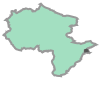

In [317]:
merged_polygons = shapely.ops.unary_union(polygons)
merged_polygons

In [318]:
# Get bounding box of our simple polygon (this will be our Region Of Interest)
bbox = merged_polygons.bounds
bbox

(6.24824398, 43.16887749, 6.62058855, 43.46040424)

## STAC
[Spatio Temporal Asset Catalog](https://stacspec.org/) is the latest standard to search and acess Earth Observation datasets.
In this part we want to use the STAC to fetch 2 satelite images, one before the fire and one after.

In [319]:
# The Hub sets PC_SDK_SUBSCRIPTION_KEY automatically.
# If you work outside of Jupyter, set the environment variable PC_SDK_SUBSCRIPTION_KEY or use python function:
# planetary_computer.settings.set_subscription_key(YOUR_API_KEY)

In [320]:
# Initialize Planetary Computer catalog instance
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

As the fire took place during august we set the time frame a bit bigger to have good quality images.

In [321]:
# Found two dates before and after the fire within our Region Of Interest
time_of_interest = "2021-06-01/2021-09-30"

In [322]:
# Searching for S2-L2 products within ROI and time range
search = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=bbox,  # or intersects=area_of_interest
    datetime=time_of_interest,
    sortby='datetime',  # By default the query returns latest first, here we sortby ascending
    query={"eo:cloud_cover": {"lt": 3}},  # cloud cover lower than 10%
)
items = search.item_collection()
print(f"Found {len(items)} items\n")

Found 51 items



In [323]:
# Convert items metadata to GeoDataFrame
gdf_items = gpd.GeoDataFrame.from_features(items.to_dict(), crs="epsg:4326")
gdf_items.head(1)

,geometry,datetime,platform,proj:epsg,instruments,s2:mgrs_tile,constellation,s2:granule_id,eo:cloud_cover,s2:datatake_id,...,s2:cloud_shadow_percentage,s2:nodata_pixel_percentage,s2:unclassified_percentage,s2:dark_features_percentage,s2:not_vegetated_percentage,s2:degraded_msi_data_percentage,s2:high_proba_clouds_percentage,s2:reflectance_conversion_factor,s2:medium_proba_clouds_percentage,s2:saturated_defective_pixel_percentage
0,"POLYGON ((7.78881 43.34590, 7.74585 43.23576, ...",2021-06-03T10:25:59.024000Z,Sentinel-2B,32632,[msi],32TLN,Sentinel 2,S2B_OPER_MSI_L2A_TL_ESRI_20210606T134142_A0221...,1.259735,GS2B_20210603T102559_022156_N03.00,...,0.316134,22.26643,13.158919,79.804945,0.265782,0.0,0.345491,0.97302,0.845496,0.0


Text(0, 0.5, 'Cloud cover (%)')

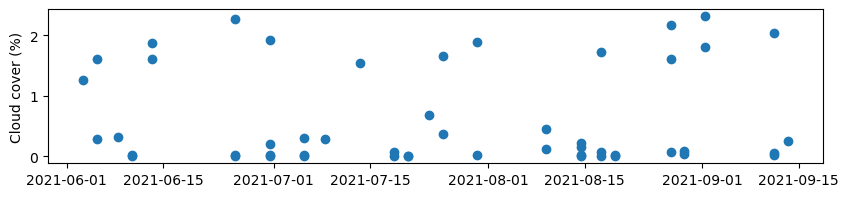

In [324]:
# Convert timestamps to datetime objects if you need to plot a time serie
gdf_items["datetime"] = pd.to_datetime(gdf_items.datetime)
fig, ax = plt.subplots(figsize=(10,2))
plt.scatter(gdf_items.datetime, gdf_items["eo:cloud_cover"])
ax.set_ylabel("Cloud cover (%)")

The query is very succesful as there is many results! We need to find 2 imges with the same view. To do so we will quickly code a slider to navigate through all result images.

In [325]:
# Here we create IPython objects that we can use with IPywidgets
images = {it.id: IPython.display.Image(url=it.assets["rendered_preview"].href, width=500) for it in items}
names = list(images.keys())

In [326]:
# Interactive function to show images, parameter name must be same than in interact() arguments
def loadimg(i=0):
    IPython.display.display(images[names[i]])
    return names[i]

In [327]:
# This is how you can create a widget. The first display will be slow, before the PNG file is cached
ipywidgets.interact(loadimg,  i=(0, len(images)-1))

interactive(children=(IntSlider(value=0, description='i', max=50), Output()), _dom_classes=('widget-interact',…

<function __main__.loadimg(i=0)>

The image we decided to keep are the 7th (before the fire) and the 48th (after the fire)

In [328]:
# Pick two dates before and after the fire (mainly between 2022/07/12 and 2022/07/29)
before, after = items[7], items[48]
before, after

(<Item id=S2B_MSIL2A_20210613T102559_R108_T31TGJ_20210623T185951>,
 <Item id=S2B_MSIL2A_20210911T102559_R108_T31TGJ_20210911T235535>)

## Explore a dataset
In this part we will use the data provided to plot different layer provided

In [329]:
# Rich provides an easy way to build pretty HTML tables
table = rich.table.Table("Asset Key", "Description")
for asset_key, asset in before.assets.items():
    table.add_row(asset_key, asset.title)
table

┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Asset Key          ┃ Description                           ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ AOT                │ Aerosol optical thickness (AOT)       │
│ B01                │ Band 1 - Coastal aerosol - 60m        │
│ B02                │ Band 2 - Blue - 10m                   │
│ B03                │ Band 3 - Green - 10m                  │
│ B04                │ Band 4 - Red - 10m                    │
│ B05                │ Band 5 - Vegetation red edge 1 - 20m  │
│ B06                │ Band 6 - Vegetation red edge 2 - 20m  │
│ B07                │ Band 7 - Vegetation red edge 3 - 20m  │
│ B08                │ Band 8 - NIR - 10m                    │
│ B09                │ Band 9 - Water vapor - 60m            │
│ B11                │ Band 11 - SWIR (1.6) - 20m            │
│ B12                │ Band 12 - SWIR (2.2) - 20m            │
│ B8A                │ Band 8A - Vegetation red edge 4 - 20m │
│ SCL                │ Scene classfication map (SCL)         │
│ WVP                │ Water vapour (WVP)                    │
│ visual             │ True color image                      │
│ preview            │ Thumbnail                             │
│ safe-manifest      │ SAFE manifest                         │
│ granule-metadata   │ Granule metadata                      │
│ inspire-metadata   │ INSPIRE metadata                      │
│ product-metadata   │ Product metadata                      │
│ datastrip-metadata │ Datastrip metadata                    │
│ tilejson           │ TileJSON with default rendering       │
│ rendered_preview   │ Rendered preview                      │
└────────────────────┴───────────────────────────────────────┘

In [330]:
# Use Leafmap to load a STAC layer (Near Infra Red data)
m = leafmap.Map()
m.add_stac_layer(collection="sentinel-2-l2a", item=after.id, assets=["B08"])
# Add a GeoDataFrame polygon layer on top of your leafmap
m.add_gdf(area_of_interest, style={'color': 'yellow'})
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [331]:
# Load full false color (NIR) image with Leafmap
m = leafmap.Map()
m.add_stac_layer(
    collection="sentinel-2-l2a",
    name=after.datetime.strftime('%Y.%m.%d'),
    item=after.id,
    assets=["B08", "B04", "B03"]
)
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

## Rasterio manipulation
The best library to ease the use of GDAL with Python. We will use it to center the view on the area of interest

In [332]:
# Open a remote 8bit GeoTIFF dataset to fetch image geometry
with rio.open(before.assets["visual"].href) as ds:
    profile = ds.profile
    # Do not not read data for now
    #array = data.read()

ds

<closed DatasetReader name='https://sentinel2l2a01.blob.core.windows.net/sentinel2-l2/31/T/GJ/2021/06/13/S2B_MSIL2A_20210613T102559_N0300_R108_T31TGJ_20210623T185951.SAFE/GRANULE/L2A_T31TGJ_A022299_20210613T103528/IMG_DATA/R10m/T31TGJ_20210613T102559_TCI_10m.tif?st=2022-12-10T14%3A42%3A59Z&se=2022-12-18T14%3A42%3A59Z&sp=rl&sv=2021-06-08&sr=c&skoid=c85c15d6-d1ae-42d4-af60-e2ca0f81359b&sktid=72f988bf-86f1-41af-91ab-2d7cd011db47&skt=2022-12-11T14%3A42%3A58Z&ske=2022-12-18T14%3A42%3A58Z&sks=b&skv=2021-06-08&sig=WXlsayr4PYvW0CLM2pT964CE9Vjl7rbezdIG47irz00%3D' mode='r'>

In [333]:
# We can use the same profile dict for different bands since this 3 things are constant
rich.print(profile)

{
    'driver': 'GTiff',
    'dtype': 'uint8',
    'nodata': 0.0,
    'width': 10980,
    'height': 10980,
    'count': 3,
    'crs': CRS.from_epsg(32631),
    'transform': Affine(10.0, 0.0, 699960.0,
       0.0, -10.0, 4900020.0),
    'blockxsize': 512,
    'blockysize': 512,
    'tiled': True,
    'compress': 'deflate',
    'interleave': 'pixel'
}

In [334]:
# Let's keep a reference to the CRS
crs = profile['crs']
crs

CRS.from_epsg(32631)

We use the boudary created before to center the view

In [335]:
# To avoid loading the full image, we need to build a window
# To do so we need a warped (i.e. projected) boundind box, and the source image transform
warped_aoi_bounds = rio.warp.transform_bounds("epsg:4326", crs, *bbox)
print('New boundaries:')
warped_aoi_bounds

New boundaries:


(762781.4039716816, 4784692.084397854, 794311.4780154731, 4818314.113379856)

In [336]:
aoi_window = rio.windows.from_bounds(*warped_aoi_bounds, transform=profile["transform"])
aoi_window

Window(col_off=6282.1403971681575, row_off=8170.588662014401, width=3153.0074043791537, height=3362.2028982001357)

In [337]:
# Round pixel size and offsets: we can't slice any array using floating points
# This is handled automatically by rasterio when you call ds.read(window=window)
aoi_window = aoi_window.round_shape().round_offsets()
aoi_window

Window(col_off=6282, row_off=8170, width=3153, height=3362)

Apply the window boundaries:

In [338]:
with rio.open(before.assets["visual"].href) as ds:
    viz_before = ds.read(window=aoi_window)

In [339]:
with rio.open(after.assets["visual"].href) as ds:
    viz_after = ds.read(window=aoi_window)

## Plot the new view images

In [340]:
# Matplotlib, PIL or skimage are expecting Cols,Rows,Bands order
np.moveaxis(viz_before, 0, 2).shape  # Move axis at index 0 to index 2

(2810, 3153, 3)

In [341]:
# There a many ways to change axis order
np.moveaxis(viz_before, 0, 2).shape \
== np.transpose(viz_before, axes=[1, 2, 0]).shape \
== np.rollaxis(viz_before, 0, 3).shape \
== rio.plot.reshape_as_image(viz_before).shape

True

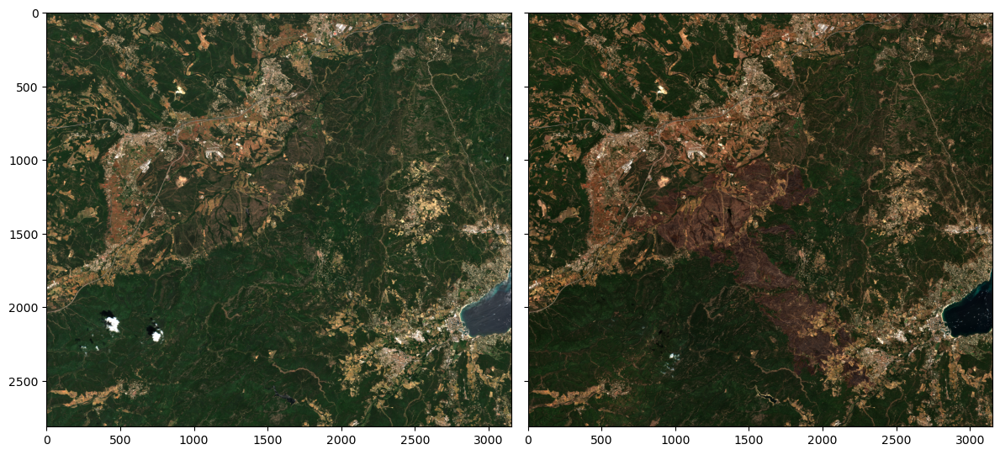

In [342]:
# Plot two images side by side, matplotlib axis with pixel coords
fig, axes = plt.subplots(1,2, figsize=(12,16), sharey=True, layout="tight")
axes[0].imshow(rio.plot.reshape_as_image(viz_before))
axes[1].imshow(rio.plot.reshape_as_image(viz_after))

Let's apply an other zoom  

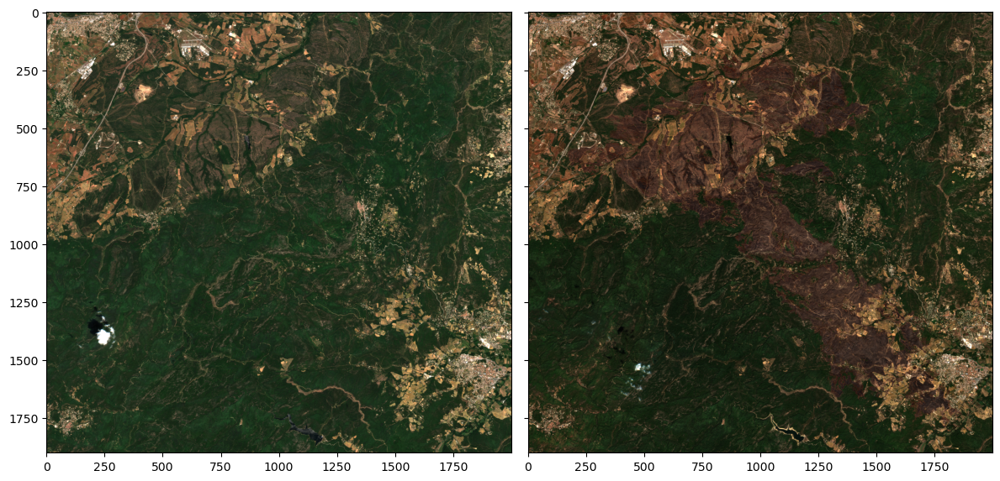

In [343]:
viz_before_zoomed=viz_before[:,800:2700,500:2500]
viz_after_zoomed=viz_after[:,800:2700,500:2500]
fig, axes = plt.subplots(1,2, figsize=(12,16), sharey=True, layout="tight")
axes[0].imshow(np.moveaxis(viz_before_zoomed, 0, 2))
axes[1].imshow(np.moveaxis(viz_after_zoomed, 0, 2))

# Indices computation

In [344]:
array_before, profile = rio_stack(before, ["B04", "B03", "B02", "B08"], aoi_window)
red, green, blue, nir = array_before.astype(np.float32)
ndvi_before = (nir - red) / (nir + red)

In [345]:
array_after, profile = rio_stack(after, ["B04", "B03", "B02", "B08"], aoi_window)
red, green, blue, nir = array_after.astype(np.float32)
ndvi_after = (nir - red) / (nir + red)

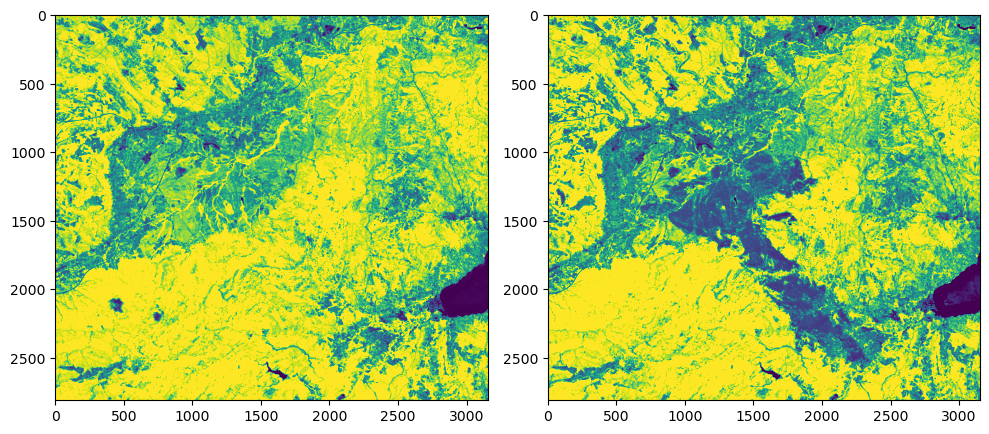

In [346]:
# Here you can see it creates some holes in our image
fig, ax = plt.subplots(1,2,figsize=(10, 20), layout='tight')
ax[0].imshow(ndvi_before, vmin=0, vmax=0.8, cmap='viridis')  # Ignore values under 0 in the colormap
ax[1].imshow(ndvi_after, vmin=0, vmax=0.8, cmap='viridis')

We can clearly see the amount of vegetation that was burned during the wildfire.

In [348]:
# Let's create a masked array, here this function will automatically mask NaNs
masked_ndvi = np.ma.masked_invalid(ndvi)
masked_ndvi

masked_array(
  data=[[0.7913844585418701, 0.807929515838623, 0.7725217342376709, ...,
         0.37287312746047974, 0.29534661769866943, 0.3229537308216095],
        [0.8152807354927063, 0.8180606365203857, 0.7657098770141602, ...,
         0.377578467130661, 0.268551230430603, 0.2962157428264618],
        [0.8020735383033752, 0.8056426048278809, 0.7492900490760803, ...,
         0.32286372780799866, 0.2566452920436859, 0.30957889556884766],
        ...,
        [0.771340548992157, 0.8095238208770752, 0.813020646572113, ...,
         0.318754643201828, 0.31565186381340027, 0.3303370773792267],
        [0.7869634628295898, 0.8313845992088318, 0.8078880310058594, ...,
         0.33358320593833923, 0.3273942172527313, 0.32380592823028564],
        [0.7889570593833923, 0.793807864189148, 0.7894737124443054, ...,
         0.30946099758148193, 0.3292016088962555, 0.31750741600990295]],
  mask=[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, 

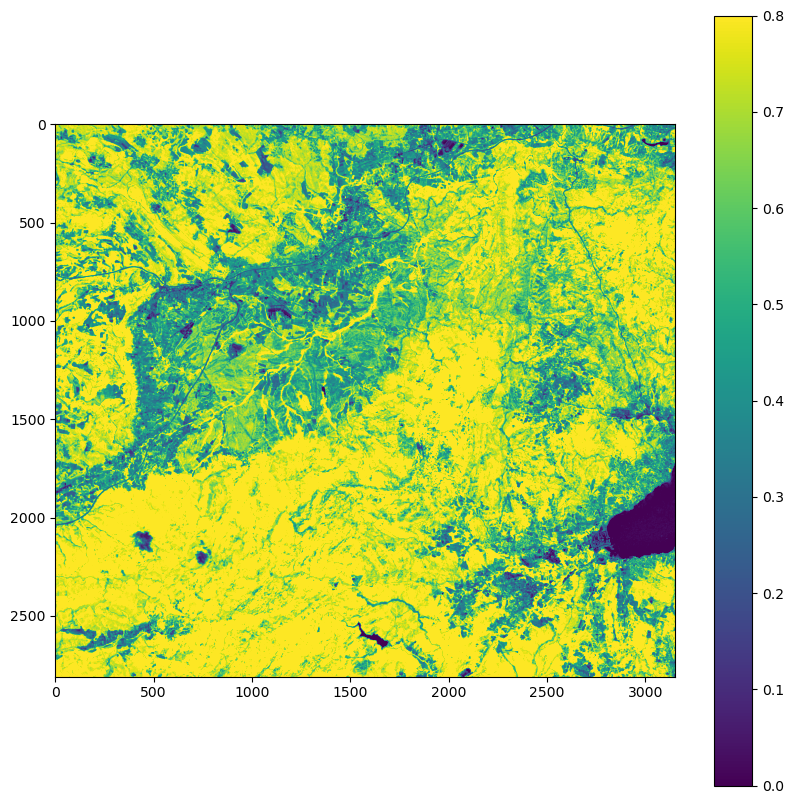

In [349]:
# Then we can use rasterio.fill to interpolate missing values (rasterio understands numpy masked arrays, see the docs)
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(rio.fill.fillnodata(masked_ndvi), vmin=0, vmax=0.8)
fig.colorbar(ax.get_children()[0])  # Create a colorbar

## Image resampling
Now, we cant to compute a Normalized Burn Ratio.  
The formula is : **(NIR - SWIR) / (NIR + SWIR)**  
If we want to use B12 with B08, we need to upsample the array. We could also use B8A which is 20m, but we want maximum precision.  

In [350]:
# GSD stands for Ground Sampling Distance
before.assets['B08'].extra_fields["gsd"] == before.assets['B12'].extra_fields["gsd"]

False

In [351]:
# Resamplign algorithms : 
def rio_open_resampled(url, scale_factor=2):
    """Open a dataset using rasterio and scale pixel size according to given factor"""
    with rio.open(url) as ds:
        profile = ds.profile
        # compute new shape
        new_height, new_width = int(ds.height * scale_factor), int(ds.width * scale_factor)
        # read data and resample on the fly
        data = ds.read(
            out_shape=(ds.count, new_height, new_width),
            resampling=rio.enums.Resampling.bilinear
        )
        # scale image transform
        transform = ds.transform * ds.transform.scale(
            (ds.width / data.shape[-1]),
            (ds.height / data.shape[-2])
        )
        # update metadata
        profile.update({"transform": transform, "height": new_height, "width": new_width})

        return data, profile

In [352]:
array_swir, profile = rio_open_resampled(before.assets['B12'].href, scale_factor=2)

In [353]:
# This is a full size image, sadly we cannot use both window and out_shape when reading a dataset
rich.print(profile)

{
    'driver': 'GTiff',
    'dtype': 'uint16',
    'nodata': 0.0,
    'width': 10980,
    'height': 10980,
    'count': 1,
    'crs': CRS.from_epsg(32631),
    'transform': Affine(10.0, 0.0, 699960.0,
       0.0, -10.0, 4900020.0),
    'blockxsize': 512,
    'blockysize': 512,
    'tiled': True,
    'compress': 'deflate',
    'interleave': 'band'
}

In [354]:
aoi_window

Window(col_off=6282, row_off=8170, width=3153, height=3362)

In [355]:
# TODO: find a way to extract ROI from array using only the aoi_window variable and numpy slicing, create a function called "windowed_array"

In [356]:
def windowed_array(array, window):
    col_start, row_start = window.col_off, window.row_off
    col_end, row_end = window.col_off + window.width, window.row_off + window.height
    return array[:, row_start:row_end, col_start:col_end]

assert windowed_array(array_swir, aoi_window)[0].shape == array_before[0].shape

In [357]:
swir = windowed_array(array_swir, aoi_window)
array_before = np.concatenate([array_before, swir])
array_before.shape


(5, 2810, 3153)

In [358]:
# TODO: create a function that (given a Sentinel-2 STAC item) returns a 5 bands array (R,G,B,NIR,SWIR) and profile dict
# Add an optional "window" argument. Use existing functions rio_stack, rio_open_resampled and windowed_array

In [359]:
def get_s2_bands(item: pystac.Item, window: rasterio.windows.Window = None):
    array, profile = rio_stack(item, ["B04", "B03", "B02", "B08"], window)
    b12, _ = rio_open_resampled(item.assets["B12"].href)
    if window is not None:
        b12 = windowed_array(b12, window)
    array = np.concatenate([array, b12])
    profile['count'] += 1
    return array, profile
get_s2_bands(before, aoi_window)[0].shape

(5, 2810, 3153)

The shape changed well we are ready to compute the Normalized burn ratio

## Index
We need to use NIR and SWIR bands to compute the Normalized burn ratio (NBR) for both images before and after.  
**NBR = (NIR - SWIR) / (NIR + SWIR)**  
**dNBR = NBR1 - NBR2**

In [360]:
def compute_nbr(array: np.ndarray):
    array = array.astype(np.float32)
    nir, swir = array[3], array[4]
    return (nir - swir) / (nir + swir)

In [ ]:
array_before, profile = get_s2_bands(before, window=aoi_window)
array_after, profile = get_s2_bands(after, window=aoi_window)
nbr_before, nbr_after = compute_nbr(array_before), compute_nbr(array_after)


In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10,10), sharey=True, layout='tight')
ax[0].imshow(nbr_before, vmin=-0.5, cmap="plasma", interpolation="bilinear")
ax[1].imshow(nbr_after, vmin=-0.5, cmap="plasma", interpolation="bilinear")

The NBR index emphasis well the burned area. Let's now comoute the difference between before and after.

In [ ]:
def get_dnbr(before: pystac.Item, after: pystac.Item, window: rasterio.windows.Window = None):
    array_before, profile = get_s2_bands(before, window=aoi_window)
    array_after, profile = get_s2_bands(after, window=aoi_window)
    nbr_before, nbr_after = compute_nbr(array_before), compute_nbr(array_after)
    dnbr = nbr_before - nbr_after
    profile.update({"dtype": "float32", "count": 1})
    return dnbr, profile


In [ ]:
dnbr, profile = get_dnbr(before, after, aoi_window)


In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(dnbr, vmin=-0.5, vmax=0.75, cmap='bwr')
fig.colorbar(ax.get_children()[0])  #Sometimes it is necessary to pass the mappable object to Colorbar()

## Vectorize raster blobs
Let's create raster entities that caracterize one class of the DNBR

In [ ]:
geoms, values = [], []
# We create a list of shapes using source image transform
for geom, value in rio.features.shapes(
    reclassified_dnbr,
    transform=profile['transform'],
    mask=(reclassified_dnbr >= 3),  # also we can mask some values
):
    geoms.append(shapely.geometry.shape(geom))
    values.append(value)

In [ ]:
# Create pandas series with our data lists: polygons and pixel values
geoms = gpd.GeoSeries(geoms)
values = pd.Series(values)

In [ ]:
# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(values.rename("dNBR_class"), geometry=geoms, crs=crs)
gdf["area_ha"] = gdf.area / 10_000
len(gdf)

In [ ]:
# We have a lot of isloated pixels. It's better to remove them or leafmap will take too long to render
gdf.sort_values("area_ha").head()
gdf = gdf[gdf.area_ha >= 0.1]
len(gdf)
# NB: be careful of what you vectorize, many isloated pixel would result in a huge list of polygons
# If you ever need to vectorize binary objects (e.g. the result of a threshold), you should always use binary cleaning before converting to polygons.

In [ ]:
gdf.explore("dNBR_class", tiles=folium_tile, cmap="copper_r", style_kwds={"stroke": None})

# Conclusion
To conclude, we use planetary computer services to fetch data before and after a wildfire. We use his data to compute indices, NDVI, NBR and DNBR to vizualise well the impact of the wildfire. Finaly we generated DNBR classification raster layer. 